## Introduction

### Data Source and Data Description

The data is located at [ai-jobs.net](https://aijobs.net/salaries/2024/) and entitled "The Global AI, ML, Data Science Salary Index for 2024 💰📊" which is based on internal data survey submissions and jobs with open salaries. The dataset is updated every week. You can contribute to them by submitting your salary info. The project collects salary information anonymously from professionals and employers all over the world and make it publicly available for anyone to use, share and play around with. The data set contains a single table with the following columns:
*   **`work_year`**: The year the salary was paid.
*   **`experience_level`**: The experience level in the job during the year with the following possible values: **EN**: Entry-level / Junior , **MI**: Mid-level / Intermediate, **SE**: Senior-level / Expert, **EX**: Executive-level / Director
*   **`employment_type`**: The type of employement for the role: **PT**: Part-time, **FT**: Full-time, **CT**: Contract, **FL**: Freelance
*   **`job_title`**:  The role worked in during the year.
*   **`salary`**: The total gross salary amount paid.
*   **`salary_currency`**: The currency of the salary paid as an ISO 4217 currency code.
*   **`salary_in_usd`**: The salary in USD (FX rate divided by avg. USD rate of respective year) via statistical data from the BIS and central banks.
*   **`employee_residence`**: Employee's primary country of residence in during the work year as an ISO 3166 country code.
*   **`remote_ratio`**: The overall amount of work done remotely, possible values are as follows: **0**: No remote work (less than 20%), **50**: Partially remote/hybird, **100**: Fully remote (more than 80%)
*   **`company_location`**: The country of the employer's main office or contracting branch as an ISO 3166 country code.
*   **`company_size`**: The average number of people that worked for the company during the year: **S**: less than 50 employees (small), **M**: 50 to 250 employees (medium), **L**: more than 250 employees (large)

## Preparing the data for analysis

In [1]:
# Import the necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import FuncFormatter
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import nltk
from wordcloud import WordCloud

from skimpy import skim


d:\PROGRAM\Anaconda\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
d:\PROGRAM\Anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
# Warnings Setting
import warnings  
warnings.filterwarnings("ignore")  
warnings.warn("this will not show") 

In [3]:
# Read the data from the CSV file
data_df = pd.read_csv('salaries.csv')
data_df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2024,MI,CT,Data Management Specialist,99000,USD,99000,US,0,US,M
1,2024,MI,CT,Data Management Specialist,81000,USD,81000,US,0,US,M
2,2024,EN,FT,Data Analyst,85000,USD,85000,US,0,US,M
3,2024,EN,FT,Data Analyst,45000,USD,45000,US,0,US,M
4,2024,EN,FT,Data Analyst,72467,USD,72467,US,0,US,M


In [4]:
# Display a concise summary of the DataFrame:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70796 entries, 0 to 70795
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           70796 non-null  int64 
 1   experience_level    70796 non-null  object
 2   employment_type     70796 non-null  object
 3   job_title           70796 non-null  object
 4   salary              70796 non-null  int64 
 5   salary_currency     70796 non-null  object
 6   salary_in_usd       70796 non-null  int64 
 7   employee_residence  70796 non-null  object
 8   remote_ratio        70796 non-null  int64 
 9   company_location    70796 non-null  object
 10  company_size        70796 non-null  object
dtypes: int64(4), object(7)
memory usage: 5.9+ MB


In [5]:
# Summarize the structure and key statistics
skim(data_df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 70796  │ │ string      │ 7     │                                                          │
│ │ Number of columns │ 11     │ │ int32       │ 4     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column          ┃ NA  ┃ NA %  ┃ mean    ┃ sd      ┃ p0     ┃ p25     ┃ p50    ┃ p75    ┃ p100     ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━┩  │
│ │ work_year       │   0 │     0 │    2024 │  0.4755 │   2020 │    2024 │   2024 │   2024 │     2024 │     ▁▇ │  │
│ │ salary          │   0 │     0 │  162800 │  194400 │  14000 │  107800 │ 148000 │ 200000 │ 30400000 │   ▇    │  │
│ │ salary_in_usd   │   0 │     0 │  158200 │   72150 │  15000 │  107700 │ 148000 │ 200000 │   800000 │  ▇▇▁   │  │
│ │ remote_ratio    │   0 │     0 │   21.71 │   41.11 │      0 │       0 │      0 │      0 │      100 │ ▇    ▂ │  │
│ └─────────────────┴─────┴───────┴─────────┴─────────┴────────┴─────────┴────────┴────────┴──────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┓  │
│ ┃           ┃    ┃      ┃          ┃           ┃           ┃           ┃ chars per  ┃ words per ┃ total      ┃  │
│ ┃ column    ┃ NA ┃ NA % ┃ shortest ┃ longest   ┃ min       ┃ max       ┃ row        ┃ row       ┃ words      ┃  │
│ ┡━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━┩  │
│ │ experienc │  0 │    0 │ MI       │ MI        │ EN        │ SE        │          2 │         1 │      70796 │  │
│ │ e_level   │    │      │          │           │           │           │            │           │            │  │
│ │ employmen │  0 │    0 │ CT       │ CT        │ CT        │ PT        │          2 │         1 │      70796 │  │
│ │ t_type    │    │      │          │           │           │           │            │           │            │  │
│ │ job_title │  0 │    0 │ Stage    │ Principal │ AI        │ Technolog │       15.4 │         2 │     144129 │  │
│ │           │    │      │          │ Applicati │ Architect │ y         │            │           │            │  │
│ │           │    │      │          │ on        │           │ Integrato │            │           │            │  │
│ │           │    │      │          │ Delivery  │           │ r         │            │           │            │  │
│ │           │    │      │          │ Consultan │           │           │            │           │            │  │
│ │           │    │      │          │ t         │           │           │            │           │            │  │
│ │ salary_cu │  0 │    0 │ USD      │ USD       │ AUD       │ ZAR       │          3 │         1 │      70796 │  │
│ │ rrency    │    │      │          │           │           │           │            │           │            │  │
│ │ employee_ │  0 │    0 │ US       │ US        │ AD   

In [6]:
# Summarize counts, nulls, unique, and duplicates
pd.DataFrame({
    'Count': data_df.count(),
    'Null': data_df.isnull().sum(),
    'Null %': data_df.isnull().mean() * 100,
    'Unique': data_df.nunique(),
    'Duplicated':(data_df.duplicated() == True).sum()})

,Count,Null,Null %,Unique,Duplicated
work_year,70796,0,0.0,5,37988
experience_level,70796,0,0.0,4,37988
employment_type,70796,0,0.0,4,37988
job_title,70796,0,0.0,286,37988
salary,70796,0,0.0,6904,37988
salary_currency,70796,0,0.0,25,37988
salary_in_usd,70796,0,0.0,7483,37988
employee_residence,70796,0,0.0,93,37988
remote_ratio,70796,0,0.0,3,37988
company_location,70796,0,0.0,86,37988


**Note**: The data set contains 37988 duplicates, representing **`53.7%`** of the data set.
I have chosen to retain these duplicates, as they appear to represent different
entries from the survey with identical responses. This is plausible, as specific
positions/roles may have identical work settings and salaries within a given
country.


## Data Cleaning

In [7]:
# Verifying the number of duplicates
duplicated_rows = data_df[data_df.duplicated()]
num_duplicates = duplicated_rows.shape[0]
print("Number of duplicated rows:", num_duplicates,"\n" "Percentage of duplicated rows:", round(num_duplicates/len(data_df),3)*100)

Number of duplicated rows: 37988 
Percentage of duplicated rows: 53.7


### Categorization and Labeling


In [8]:
# Generating Job Category Labels
# Mapping the job titles to job categories

def map_job_title(data_df, original_column = 'job_title', new_column = 'job_category'):
        job_title_mapping = {
            # Data Science and Research
                'data scientist': 'Data Scientist',
                'data science': 'Data Scientist',
                'decision scientist': 'Data Scientist',
                'research scientist': 'Data Scientist',
                'research engineer': 'Data Scientist',
                'computational biologist': 'Data Scientist',
                'applied scientist': 'Data Scientist',
                'data specialist ': 'Data Scientist',

                # Data Engineering
                'data engineer': 'Data Engineering',
                'etl': 'Data Engineering',
                'pipeline': 'Data Engineering',
                'big data': 'Data Engineering',
                'robotics': 'Data Engineering',
                'nlp': 'Data Engineering',
                'data architect': 'Data Architecture and Modeling', 
                'data modeler': 'Data Architecture and Modeling',
                'data manager':'Data Management and Strategy', 
                'cloud data': 'Cloud and Database', 

                # Data Analysis
                'data analyst': 'Data Analysis',
                'bi analyst': 'Data Analysis',
                'analytics': 'Data Analysis',
                'statistician': 'Data Analysis',
                'quantitative': 'Data Analysis',
                'research analyst': 'Data Analysis',
                'bi developer': 'BI and Visualization', 
                'power bi': 'BI and Visualization',
                'business intelligence': 'BI and Visualization',                

                # Machine Learning and AI
                'machine learning': 'Machine Learning and AI',
                'deep learning': 'Machine Learning and AI',                
                'ml': 'Machine Learning and AI',
                'ai': 'Machine Learning and AI',

                # Leadership and Management
                'head of data': 'Leadership and Management',
                'director': 'Leadership and Management',
        }       

        data_df[new_column] = data_df[original_column].str.lower().apply(
                lambda title: next((v for k, v in job_title_mapping.items() if k in title), 'Data Scientist'))
        return data_df

data_df = map_job_title(data_df)

In [9]:
# Generating Work Model Labels
# Mapping remote ratio to work model

def map_remote_ratio(data_df, original_column = 'remote_ratio', new_column = 'work_model'):
        remote_ratio_mapping = {
                0: 'Onsite',
                50: 'Hybrid',
                100: 'Remote'
        }       

        data_df[new_column] = data_df[original_column].map(remote_ratio_mapping).fillna('Other')
        return data_df

data_df = map_remote_ratio(data_df)

In [10]:
# Renaming Experience Level Labels
# Mapping experience levels to more descriptive labels

def map_experience_level(data_df, original_column = 'experience_level', new_column = 'experience_level'):
        experience_level_mapping = {
                'EN': 'Junior',
                'MI': 'Mid-Level',
                'SE': 'Senior',
                'EX': 'Director',
        }       

        data_df[new_column] = data_df[original_column].replace(experience_level_mapping)
        return data_df

data_df = map_experience_level(data_df)

In [11]:
# Renaming Employment Type Labels
# Mapping employment types to more descriptive labels

def map_employment_type(data_df, original_column = 'employment_type', new_column = 'employment_type'):
        employment_type_mapping = {
                'FT': 'Full-Time',
                'PT': 'Part-Time',
                'CT': 'Contract',
                'FL': 'Freelance'
        }

        data_df[new_column] = data_df[original_column].map(employment_type_mapping).fillna('Other')
        return data_df

data_df = map_employment_type(data_df)

In [12]:
# Renaming Company Size Labels
# Mapping company size to more descriptive labels

def map_company_size(data_df, original_column = 'company_size', new_column = 'company_size'):
        employment_type_mapping = {
                'S': 'Small',
                'M': 'Medium',
                'L': 'Large'
        }

        data_df[new_column] = data_df[original_column].map(employment_type_mapping).fillna('Other')
        return data_df

data_df = map_company_size(data_df)

In [13]:
# Renaming Company Location Labels
# Mapping company location to more descriptive labels

def map_company_location(data_df, original_column = 'company_location', new_column = 'company_location'):
        country_mapping = {
                'US': 'United States',
                'CA': 'Canada',
                'GB': 'United Kingdom',
                'AU': 'Australia',
                'ES': 'Spain',
                'NL': 'Netherlands',
                'CD': 'Congo (Kinshasa)',
                'FR': 'France',
                'LT': 'Lithuania',
                'PH': 'Philippines',
                'NZ': 'New Zealand',
                'SK': 'Slovakia',
                'CH': 'Switzerland',
                'AT': 'Austria',
                'LV': 'Latvia',
                'IT': 'Italy',
                'IL': 'Israel',
                'PL': 'Poland',
                'CZ': 'Czechia',
                'IE': 'Ireland',
                'JP': 'Japan',
                'IN': 'India',
                'SG': 'Singapore',
                'PE': 'Peru',
                'KR': 'South Korea',
                'DE': 'Germany',
                'ZA': 'South Africa',
                'EG': 'Egypt',
                'PR': 'Puerto Rico',
                'LB': 'Lebanon',
                'BR': 'Brazil',
                'GR': 'Greece',
                'AR': 'Argentina',
                'FI': 'Finland',
                'MX': 'Mexico',
                'DK': 'Denmark',
                'NG': 'Nigeria',
                'BE': 'Belgium',
                'CY': 'Cyprus',
                'CO': 'Colombia',
                'CL': 'Chile',
                'BG': 'Bulgaria',
                'EC': 'Ecuador',
                'SV': 'El Salvador',
                'CR': 'Costa Rica',
                'HU': 'Hungary',
                'PT': 'Portugal',
                'HR': 'Croatia',
                'KE': 'Kenya',
                'SE': 'Sweden',
                'UA': 'Ukraine',
                'TR': 'Turkey',
                'PK': 'Pakistan',
                'AM': 'Armenia',
                'HN': 'Honduras',
                'MT': 'Malta',
                'RO': 'Romania',
                'VE': 'Venezuela',
                'DZ': 'Algeria',
                'AS': 'American Samoa',
                'LU': 'Luxembourg',
                'RS': 'Serbia',
                'AE': 'United Arab Emirates',
                'SA': 'Saudi Arabia',
                'OM': 'Oman',
                'BA': 'Bosnia and Herzegovina',
                'EE': 'Estonia',
                'VN': 'Vietnam',
                'GI': 'Gibraltar',
                'SI': 'Slovenia',
                'MU': 'Mauritius',
                'RU': 'Russia',
                'QA': 'Qatar',
                'GH': 'Ghana',
                'AD': 'Andorra',
                'NO': 'Norway',
                'HK': 'Hong Kong',
                'CF': 'Central African Republic',
                'TH': 'Thailand',
                'IR': 'Iran',
                'BS': 'Bahamas',
                'ID': 'Indonesia',
                'MY': 'Malaysia',
                'IQ': 'Iraq',
                'CN': 'China',
                'MD': 'Moldova'
        }

        data_df[new_column] = data_df[original_column].map(country_mapping).fillna('Other')
        return data_df

data_df = map_company_location(data_df)

In [14]:
# Renaming Employee residence Labels
# Mapping Employee residence to more descriptive labels

def map_employee_residence(data_df, original_column = 'employee_residence', new_column = 'employee_residence'):
        country_mapping = {
                'US': 'United States',
                'CA': 'Canada',
                'GB': 'United Kingdom',
                'AU': 'Australia',
                'ES': 'Spain',
                'NL': 'Netherlands',
                'CD': 'Congo (Kinshasa)',
                'FR': 'France',
                'LT': 'Lithuania',
                'PH': 'Philippines',
                'NZ': 'New Zealand',
                'SK': 'Slovakia',
                'CH': 'Switzerland',
                'AT': 'Austria',
                'LV': 'Latvia',
                'IT': 'Italy',
                'IL': 'Israel',
                'PL': 'Poland',
                'CZ': 'Czechia',
                'IE': 'Ireland',
                'JP': 'Japan',
                'IN': 'India',
                'SG': 'Singapore',
                'PE': 'Peru',
                'KR': 'South Korea',
                'DE': 'Germany',
                'ZA': 'South Africa',
                'EG': 'Egypt',
                'PR': 'Puerto Rico',
                'LB': 'Lebanon',
                'BR': 'Brazil',
                'GR': 'Greece',
                'AR': 'Argentina',
                'FI': 'Finland',
                'MX': 'Mexico',
                'DK': 'Denmark',
                'NG': 'Nigeria',
                'BE': 'Belgium',
                'CY': 'Cyprus',
                'CO': 'Colombia',
                'CL': 'Chile',
                'BG': 'Bulgaria',
                'EC': 'Ecuador',
                'SV': 'El Salvador',
                'CR': 'Costa Rica',
                'HU': 'Hungary',
                'PT': 'Portugal',
                'HR': 'Croatia',
                'KE': 'Kenya',
                'SE': 'Sweden',
                'UA': 'Ukraine',
                'TR': 'Turkey',
                'PK': 'Pakistan',
                'AM': 'Armenia',
                'HN': 'Honduras',
                'MT': 'Malta',
                'RO': 'Romania',
                'VE': 'Venezuela',
                'DZ': 'Algeria',
                'AS': 'American Samoa',
                'LU': 'Luxembourg',
                'RS': 'Serbia',
                'AE': 'United Arab Emirates',
                'SA': 'Saudi Arabia',
                'OM': 'Oman',
                'BA': 'Bosnia and Herzegovina',
                'EE': 'Estonia',
                'VN': 'Vietnam',
                'GI': 'Gibraltar',
                'SI': 'Slovenia',
                'MU': 'Mauritius',
                'RU': 'Russia',
                'QA': 'Qatar',
                'GH': 'Ghana',
                'AD': 'Andorra',
                'NO': 'Norway',
                'HK': 'Hong Kong',
                'CF': 'Central African Republic',
                'TH': 'Thailand',
                'IR': 'Iran',
                'BS': 'Bahamas',
                'ID': 'Indonesia',
                'MY': 'Malaysia',
                'IQ': 'Iraq',
                'CN': 'China',
                'MD': 'Moldova'
        }

        data_df[new_column] = data_df[original_column].map(country_mapping).fillna('Other')
        return data_df

data_df = map_employee_residence(data_df)

In [15]:
data_df

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_category,work_model
0,2024,Mid-Level,Contract,Data Management Specialist,99000,USD,99000,United States,0,United States,Medium,Data Scientist,Onsite
1,2024,Mid-Level,Contract,Data Management Specialist,81000,USD,81000,United States,0,United States,Medium,Data Scientist,Onsite
2,2024,Junior,Full-Time,Data Analyst,85000,USD,85000,United States,0,United States,Medium,Data Analysis,Onsite
3,2024,Junior,Full-Time,Data Analyst,45000,USD,45000,United States,0,United States,Medium,Data Analysis,Onsite
4,2024,Junior,Full-Time,Data Analyst,72467,USD,72467,United States,0,United States,Medium,Data Analysis,Onsite
...,...,...,...,...,...,...,...,...,...,...,...,...,...
70791,2020,Senior,Full-Time,Data Scientist,412000,USD,412000,United States,100,United States,Large,Data Scientist,Remote
70792,2021,Mid-Level,Full-Time,Principal Data Scientist,151000,USD,151000,United States,100,United States,Large,Data Scientist,Remote
70793,2020,Junior,Full-Time,Data Scientist,105000,USD,105000,United States,100,United States,Small,Data Scientist,Remote
70794,2020,Junior,Contract,Business Data Analyst,100000,USD,100000,United States,100,United States,Large,Data Analysis,Remote


### Detecting and handing outliers

In [16]:
# BoxPlot & DistPlot for Salary
hist_data = [data_df['salary_in_usd']]
group_labels = ['Salary in USD']

fig1 = px.box(y=data_df['salary_in_usd'], title='Salary (BoxPlot)')
fig2 = ff.create_distplot(hist_data, group_labels, show_hist=False)

fig = make_subplots(rows=1, cols=2, subplot_titles=('Salary (BoxPlot)', 'Salary (DistPlot)'))
for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)
for trace in fig2.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(height=500, width=1000, showlegend=False)
fig.show()

The box plot and distribution plot both highlight a right-skewed salary
distribution. The box plot shows the concentration of salaries within the IQR, with
many outliers at higher values. The distribution plot confirms this skew, with a
peak at lower salaries and a long tail indicating the presence of higher outliers

We calculate Q1, Q2, Q2, and the IQR to determine the lower and upper
bounds for outlier detection. Then, we identify the specific data points
that fall outside these bounds.

In [17]:
# Handing Outliers
# Finding Q1, Q2, Q3 and calculating IQR, MIN, MAX

Q1 = data_df['salary_in_usd'].quantile(0.25)
Q2 = data_df['salary_in_usd'].quantile(0.5)
Q3 = data_df['salary_in_usd'].quantile(0.75)
IQR = Q3 - Q1

print(f"Q1 = {Q1}, Q2 = {Q2}, Q3 = {Q3} \n")
print(f"IQR = {IQR} \n")

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(f"MIN = {lower_bound}, MAX = {upper_bound}")

Q1 = 107730.0, Q2 = 148000.0, Q3 = 200000.0 

IQR = 92270.0 

MIN = -30675.0, MAX = 338405.0


In [18]:
# Detecting Outliers

# Identify outliers outside the defined bounds.
salary_data = data_df['salary_in_usd']
outliers = salary_data[(salary_data < lower_bound) | (salary_data > upper_bound)]

# Count and display the number of outliers detected.
outliers_count = len(outliers)
print(f"Number of outliers: {outliers_count}")

Number of outliers: 1327


In [19]:
# Remove rows containing outliers from the dataset.
data_df = data_df[~data_df['salary_in_usd'].isin(outliers)]
print("Outliers removed")

Outliers removed


In [20]:
# BoxPlot & DistPlot for Salary : Outliers Removed
hist_data = [data_df['salary_in_usd']]
group_labels = ['Salary in USD']

fig1 = px.box(y=data_df['salary_in_usd'], title='Salary (BoxPlot)')
fig2 = ff.create_distplot(hist_data, group_labels, show_hist=False)

fig = make_subplots(rows=1, cols=2, subplot_titles=('Salary (BoxPlot)', 'Salary (DistPlot)'))
for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)
for trace in fig2.data:
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(height=500, width=1000, showlegend=False)
fig.show()

The new plots indicate the positive impact of the outlier removal process.
These showcase a more representative and cleaner distribution of salaries,
which is now more suitable for further analysis or model training. This
distribution is still right skewed but to a far smaller extent.

## Data Analysis and Visualization

### Data Overview and Analysis

#### Univariate Analysis: unique values and frequency

*  Analyzing **`work_year`**:

In [21]:
# Calculate the frequency and proportion of occurrences for each unique value in the "work_year" column
data_work = data_df['work_year'].value_counts().reset_index()
data_work.columns = ['work_year', 'count']
data_work = data_work.sort_values('work_year')
data_work['proportion (%)'] = round(data_work['count'] / len(data_df) * 100, 1)
print(data_work)

fig = px.bar(data_work, 
             x='work_year', 
             y='count', 
             title='Job Postings Over Years', 
             text='proportion (%)', 
             labels={'work_year': 'Year', 'count':'Number of Jobs'}, 
             color_discrete_sequence=px.colors.sequential.Purp_r)
            # color='work_year')
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(xaxis=dict(tickmode='array', 
                             tickvals=data_work['work_year'].to_list(), 
                             ticktext = data_work['work_year'].to_list()), 
                             width=800, height=600
                )
fig.show()

   work_year  count  proportion (%)
4       2020     73             0.1
3       2021    216             0.3
2       2022   1652             2.4
1       2023   8456            12.2
0       2024  59072            85.0


**Insights:** 
* There will be a boom in demand in 2024, with 85 percent of job
postings in data science, showing strong investments by businesses in
data-driven solutions.
* Career opportunities are abundant in 2024 with high demand for skills
in Machine Learning, AI, and Data Engineering.
* Industry trends show rapid growth in Data Science, especially in
sectors like finance, technology, and healthcare.


* Analyzing **`job_category`**:

In [22]:
# Calculate the frequency and proportion of occurrences for each unique value in the "job_category" column
data_job = data_df['job_category'].value_counts().reset_index()
data_job.columns = ['job_category', 'count']
data_job = data_job.sort_values('count', ascending=False)
data_job['proportion (%)'] = round(data_job['count'] / len(data_df) * 100, 1)
print(data_job)

max_count = data_job['count'].max()
ylim_max = max_count + (max_count * 0.1)


fig = px.bar(
    data_job,
    x='job_category',
    y='count',
    title='Frequency of Job Category',
    text='proportion (%)',
    labels={'job_category': 'Job Category', 'count':'Number of Jobs'},
    color='job_category',
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(width=900, height=600, xaxis_tickangle=-90, yaxis_range=[0, ylim_max])
fig.show()

                     job_category  count  proportion (%)
0                  Data Scientist  39317            56.6
1                Data Engineering   9378            13.5
2                   Data Analysis   9193            13.2
3         Machine Learning and AI   7598            10.9
4            BI and Visualization   1862             2.7
5  Data Architecture and Modeling   1345             1.9
6    Data Management and Strategy    573             0.8
7       Leadership and Management    150             0.2
8              Cloud and Database     53             0.1


**Insights:**
* **Data Scientist Lead**: Data Scientist positions are the most in-demand, comprising over half (**`56.6%`**) of all job postings, indicating a strong market focus.
* **Secondary Demand**: Data Engineering (**`13.5%`**) and Data Analysis (**`13.2%`**) are the next most prevalent roles.
* **Niche & Specialized Roles**: Other categories like Machine Learning/AI (**`10.9%`**) and BI/Visualization (**`2.7%`**) have a smaller but noteworthy presence, indicating specialization within Data Science. The rest (Data Architecture, Data Management, Leadership, and Cloud) have relatively little representation.
* **Lower Frequency Roles**: The remaining categories (`BI and Visualization`, `Data Architecture and Modeling`, `Data Management and Strategy`, `Leadership and Management`, and `Cloud and Database`) have substantially lower job counts, each with less than **`3%`** and represented by the shorter bars.


In [23]:
# Filter the DataFrame for 'Data Science' job category

data_science_df = data_df[data_df['job_category'] == 'Data Scientist']
data_science = data_science_df['job_title'].value_counts().reset_index()
data_science.columns = ['job_title', 'count']
data_science['proportion (%)'] = round(data_science['count'] / len(data_science_df) * 100, 1)
data_science


,job_title,count,proportion (%)
0,Data Scientist,11091,28.2
1,Software Engineer,7341,18.7
2,Engineer,3724,9.5
3,Manager,2284,5.8
4,Research Scientist,2144,5.5
...,...,...,...
150,Business Development Manager,1,0.0
151,Data Scientist Manager,1,0.0
152,Enterprise Account Executive,1,0.0
153,Backend Software Engineer,1,0.0


In [24]:
# Filter the DataFrame for 'Data Analysis' job category

data_analysis_df = data_df[data_df['job_category'] == 'Data Analysis']
data_analysis = data_analysis_df['job_title'].value_counts().reset_index()
data_analysis.columns = ['job_title', 'count']
data_analysis['proportion (%)'] = round(data_analysis['count'] / len(data_analysis_df) * 100, 1)
data_analysis

,job_title,count,proportion (%)
0,Data Analyst,7061,76.8
1,Analytics Engineer,1093,11.9
2,Research Analyst,330,3.6
3,Data Analytics Manager,130,1.4
4,BI Analyst,127,1.4
5,Data Analytics Lead,76,0.8
6,Data Analytics Specialist,50,0.5
7,Quantitative Analyst,48,0.5
8,Quantitative Researcher,43,0.5
9,Analytics Lead,40,0.4


* Analyzing **`job_title`**:


In [25]:
# Job Postings by Job Titles (Top 10)

top_10_job_titles = data_df['job_title'].value_counts()[:10]

fig = px.bar(x=top_10_job_titles.index, 
             y=top_10_job_titles.values, 
             color = top_10_job_titles.index,
             color_discrete_sequence=px.colors.qualitative.Set2,
             text = top_10_job_titles.values,
             title='Job Postings by Job Titles (Top 10)' ,
             width=900, height=600  
            )
fig.update_layout(xaxis_title='Job Title', yaxis_title='Number of Jobs', xaxis_tickangle=-90, font=dict(size=12))
fig.show()

**Insights:**
* **Data Scientist Core**: Data Scientist is the most in-demand role,
highlighting the need for strong analytical skills.
* **Infrastructure Matters**: High demands for Data Engineers underscores
the importance of data infrastructure.
* **Tech and Analysis Balance**: Software & Data Analysts are crucial,
showing a need for both implementation and interpretation.
* **AI Growth**: Machine Learning Engineers are in high demand, reflecting
the growth in AI.
* **Top Tier Demand**: There is a clear demand divide between the top 5
jobs in the list and the rest.


* Analyzing **`experience_level`**:


In [26]:
# Experience Level Distribution
experience_levels_order = ['Junior', 'Mid-Level', 'Senior', 'Director']
data_df['experience_level'] = pd.Categorical(data_df['experience_level'], categories=experience_levels_order, ordered=True)
exp_level = data_df['experience_level'].value_counts().reset_index()
exp_level.columns = ['experience_level', 'count']
exp_level = exp_level.sort_values(by = 'experience_level', ascending=True)
exp_level['proportion (%)'] = round(exp_level['count'] / len(data_df) * 100, 1)
print(exp_level)

fig = px.bar(
    exp_level,
    y='experience_level',
    x='count',
    text='proportion (%)',
    title='Experience Level Distribution',
    labels={'experience_level': 'Experience Level', 'count':'Number of Jobs'},
    color='experience_level', 
    width= 1000, height=700, orientation='h'
)


fig.update_traces(texttemplate='%{text:.1f}%')
fig.update_layout(xaxis=dict(tickmode='array', tickvals=experience_levels_order, ticktext = experience_levels_order), width=800, height=600)
fig.show()

  experience_level  count  proportion (%)
2           Junior   6554             9.4
1        Mid-Level  20801            29.9
0           Senior  40718            58.6
3         Director   1396             2.0


* Analyzing **`employment_type`**:


In [27]:
# Employment Type Distribution

emp_type = data_df['employment_type'].value_counts().reset_index()
emp_type.columns = ['employment_type', 'count']
emp_type['proportion (%)'] = round(emp_type['count'] / len(data_df) * 100, 1)
emp_type = emp_type.sort_values(by='count', ascending=False)
print(emp_type)

max_count = emp_type['count'].max()
ylim_max = max_count + (max_count * 0.1)

fig = px.bar(
    emp_type, 
    x='employment_type', 
    y='count',
    text='proportion (%)', 
    title='Employment Type Distribution',
    labels={'employment_type': 'Employment Type', 'count': 'Number of Jobs'},
    color_discrete_sequence=px.colors.qualitative.Set2,
    width=700, height=600
)

# Customizes the display of percentage in the bars
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(xaxis_tickangle=0)
fig.update_layout(yaxis_range=[0, ylim_max])
fig.show()

  employment_type  count  proportion (%)
0       Full-Time  69145            99.5
1       Part-Time    164             0.2
2        Contract    144             0.2
3       Freelance     16             0.0


**Insights:**

The data industry primarily hires for stable, full-time positions, with a strong emphasis on experienced professionals, particularly at the senior
level. This structure reveals a clear career path for those moving from junior to mid-level and ultimately to senior roles, yet also indicates a
competitive environment both for employers seeking talent and for data professionals pursuing career advancement.


* Analyzing **`employee_residence`**:

In [28]:
# Employee Residence Distribution (Top 10) 

top_10_employee_residence = data_df['employee_residence'].value_counts()[:10]

fig = px.bar(x=top_10_employee_residence.index, 
             y=top_10_employee_residence.values, 
             color = top_10_employee_residence.index,
             text = top_10_employee_residence.values,
             title='Job Postings by Employee Residence (Top 10)',
             width=900, height=600  
            )
fig.update_layout(xaxis_title='Employee Residence', yaxis_title='Number of Jobs', font=dict(size=11),xaxis_tickangle=-90)
fig.show()

* Analyzing **`company_location`**:


In [29]:
# Job Postings by Company Location (Top 10)

top_10_company_loc = data_df['company_location'].value_counts()[:10]

fig = px.bar(x=top_10_company_loc.index, 
             y=top_10_company_loc.values, 
             color = top_10_company_loc.index,
             text = top_10_company_loc.values,
             title='Job Postings by Company Location (Top 10)',
             width=900, height=600  
            )
fig.update_layout(xaxis_title='Company Location', yaxis_title='Number of Jobs', font=dict(size=11),xaxis_tickangle=-90)
fig.show()

**Insights:**
**Overwhelming Dominance of the United States**

* Both charts show the United States as the dominant location
for both job postings and employee residence, with a
significantly larger number of postings than all other countries
combined.
* This suggests the US is the major hub for the Data industry. It’s
the primary driver of demand and likely experts the strongest
influence on global salary benchmarks.

**Secondary Hubs: Canada and the United Kingdom**

* Both Canada and the UK follow the US as secondary locations
for job postings and employee residences but at a much lower
volume.
* These represent significant, though smaller, hubs for the Data
industry, potentially reflecting strong tech sectors or
international business centers.

**Other European Countries**

* Other European countries, such as Germany, Spain, France
and the Netherlands, have moderate representation for both
job postings and employee residence.
* This likely reflects the presence of growing technology sectors
within these regions.


* **Employees Working in Own Country**

In [30]:
residence_company = data_df[['employee_residence', 'company_location']]

a = []
for (i, j) in zip(residence_company['employee_residence'], residence_company['company_location']):
    if i == j:
        a.append('Yes')
    else:
        a.append('No')   
residence_company['work_own_country'] = a

# Count the occurrences of "Yes" and "No"
counts = residence_company['work_own_country'].value_counts()
print(counts)

# Create a pie chart
fig = px.pie(names=counts.index, values=counts.values,
             title='Employees Working in Own Country',
             labels={'names': 'Working in Own Country?', 'values': 'Number of Employees'})
fig.update_traces(textinfo='percent+label') 
fig.show()


work_own_country
Yes    69329
No       140
Name: count, dtype: int64


The chart shows that most employees do not seek job
opportunities abroad. This could be due to domestic salaries
meeting their living needs, as well as cultural factor, where
individuals prefer to work close to their families and
communities.


* Analyzing **`company_size`** and **`work_model`**:


In [31]:
# Company Size and Work Model Distribution
company_size_order = ['Small', 'Medium', 'Large']
work_model_order = ['Onsite', 'Hybrid', 'Remote']

# Convert 'company_size' and 'work_model' to Categorical data type
data_df['company_size'] = pd.Categorical(data_df['company_size'], categories=company_size_order, ordered=True)
data_df['work_model'] = pd.Categorical(data_df['work_model'], categories=work_model_order, ordered=True)

# Create subplots
fig = make_subplots(rows=1, cols=2,
                    specs=[[{'type':'domain'}, {'type':'domain'}]])

# Pie chart for 'company_size'
company_size_data = data_df['company_size'].value_counts().reset_index()
company_size_data.columns = ['company_size', 'count']
company_size_data['proportion (%)'] = round(company_size_data['count'] / len(data_df) * 100, 2)
fig.add_trace(go.Pie(labels=company_size_data['company_size'],
                     values=company_size_data['count'],
                     textinfo='percent+label',
                     marker_colors=px.colors.qualitative.Set2,
                     name="Company Size",
                     insidetextorientation='horizontal',
                     ),
                    row=1, col=1)

# Pie chart for 'work_model'
work_model_data = data_df['work_model'].value_counts().reset_index()
work_model_data.columns = ['work_model', 'count']
work_model_data['proportion (%)'] = round(work_model_data['count'] / len(data_df) * 100, 2)
fig.add_trace(go.Pie(labels=work_model_data['work_model'],
                     values=work_model_data['count'],
                     textinfo='percent+label',
                     marker_colors=px.colors.qualitative.Set2,
                     name="Work Model",
                     insidetextorientation='horizontal'
                     ),
                    row=1, col=2)


# Update layout and add annotations as titles at the bottom
fig.update_layout(
    width=800,
    height=500,
    showlegend=False,
    annotations=[
        dict(text="Company Size Distribution", x=0.2, y=-0.1,  xanchor='center', showarrow=False, font=dict(size=16)),
        dict(text="Work Model Distribution", x=0.8, y=-0.1,  xanchor='center', showarrow=False, font=dict(size=16))
    ]
)
fig.show()

**Insights:**
* Medium-sized companies employ the vast majority of data
professionals (**`96.3%`**), compared to the very small number at small
(**`0.294%`**) and large (**`3.36%`**) firms.
* This could mean that medium-sized companies likely have the
resources and growth stage that drive the demand for dedicated
data teams. Smaller companies may have limited budgets and
needs, and larger companies may focus on internal promotion,
which decreases the need for external talent.
* Onsite positions are the most common in the data industry
(**`77.8%`**), while remote work has a substantial presence (**`21.8%`**),
and hybrid work is less frequent (**`0.4%`**).
* The preference for onsite work in the data industry persists due to
collaboration needs, team dynamics, security issues, and other
factors related to physical location.


### Exploratory Data Analysis

#### Salary & Job Posting Trends Over time

In [32]:
# Overview - Salary & Job Posting Trends Over time

# 1st Chart: Salary Trends Over Time
salary_trends = data_df.groupby(['work_year'])['salary_in_usd'].mean().reset_index()
fig1 = px.line(salary_trends, x='work_year', y='salary_in_usd', title='Salary Trends Over Time', markers=True)
fig1.update_xaxes(tickvals=salary_trends['work_year'].unique(), tickformat='%Y')

# 2nd Chart: Salary Trends Over Time by Job Category
salary_trends_by_category = data_df.groupby(['work_year', 'job_category'])['salary_in_usd'].mean().reset_index()
fig2 = px.line(salary_trends_by_category, x='work_year', y='salary_in_usd', color='job_category', title='Salary Trends Over Time by Job Category', markers=True)
fig2.update_xaxes(tickvals=salary_trends['work_year'].unique(), tickformat='%Y')

# 3rd Chart: Job Posting Over Time
job_postings_over_time = data_df.groupby(['work_year'])['job_category'].count().reset_index(name='count')
fig3 = px.line(job_postings_over_time, x='work_year', y='count', title='Job Posting Over Time', markers=True)
fig3.update_xaxes(tickvals=salary_trends['work_year'].unique(), tickformat='%Y')

# 4th Chart: Job Posting Over Time by Job Category
job_postings_by_category = data_df.groupby(['work_year', 'job_category']).size().reset_index(name='count')
fig4 = px.line(job_postings_by_category, x='work_year', y='count', color='job_category', title='Job Posting Over Time by Job Category', markers=True)
fig4.update_xaxes(tickvals=salary_trends['work_year'].unique(), tickformat='%Y')

# Creating Subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=('Salary Trends Over Time', 'Salary Trends Over Time by Job Category', 'Job Posting Over Time', 'Job Posting Over Time by Job Category'))

for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig2.data:
    fig.add_trace(trace, row=1, col=2)

for trace in fig3.data:
    fig.add_trace(trace, row=2, col=1)

for trace in fig4.data:
    fig.add_trace(trace, row=2, col=2)

fig.update_layout(title='Overview: Salary and Job Postings Trends', height = 800, width = 1200)
fig.show()

#### Remote Work Model Trends Over time

In [119]:
# Remote Work Model Trends Over Years

remote_trend = data_df.groupby(['work_year', 'work_model']).size().unstack().fillna(0)
remote_trend_percentage = remote_trend.div(remote_trend.sum(axis=1), axis=0) *100

remote_trend_percentage = remote_trend_percentage.reset_index()

fig = px.area(remote_trend_percentage,
              x='work_year', 
              y=remote_trend_percentage.columns[1:], 
              title='Remote Work Trends Over Years', 
              labels={'work_year': 'Year', 'value':'Percentage (%)', 'variable':'Work Model'}, 
              color_discrete_sequence=px.colors.qualitative.Plotly)

fig.update_layout(xaxis=dict(tickmode='array', tickvals=remote_trend_percentage['work_year'].to_list(), ticktext = remote_trend_percentage['work_year'].to_list()),
                  yaxis=dict(range=[0,100]), legend=dict(title='Work Model', orientation="v", yanchor="auto", y=1, xanchor="right", x=1), width=800, height=600)
fig.show()

**Insights:**
* **Remote Work Trends:** The hybrid work model was notable in 2020, but disappeared by 2024. Remote work increased and then declined, with onsite work becoming dominant again by 2024.
* **Overall Salary Growth**: There has been a consistent upward trend in salaries from 2020 to 2024, with a notable jump between 2022 and 2023 and then again in 2024.
* **Salary Trends by Category:** Leadership/Management and Data Science roles command the highest salaries, with notable growth also in Data Engineering roles.
* **Job Posting Growth:** Job postings have steadily increased from 2020 to 2023, and saw a huge jump in 2024.
* **Job Posting by Category:** Data Scientist, Data Analysis, Data Engineering ,and Machine Learning/AI roles have seen the largest growth in job postings.

#### **Experience Level** with Top 3 Job Titles

In [75]:
# Experience Level with Top 3 Job Titles
# Group by experience level and job title, count occurrences
experience_levels_order = ['Junior', 'Mid-Level', 'Senior', 'Director']
exp_level_job = data_df.groupby(['experience_level', 'job_title']).size().reset_index(name='count')
exp_level_job['experience_level'] = pd.Categorical(exp_level_job['experience_level'], categories=experience_levels_order, ordered=True)

# Top 3 Job Titles by Experience Level
junior_top3 = exp_level_job[exp_level_job['experience_level'] == 'Junior'].sort_values('count', ascending=False).head(3)
mid_top3 = exp_level_job[exp_level_job['experience_level'] == 'Mid-Level'].sort_values('count', ascending=False).head(3)
senior_top3 = exp_level_job[exp_level_job['experience_level'] == 'Senior'].sort_values('count', ascending=False).head(3)
director_top3 = exp_level_job[exp_level_job['experience_level'] == 'Director'].sort_values('count', ascending=False).head(3)

fig = go.Figure(data=[
    go.Bar(name='Junior', x=junior_top3['job_title'], y=junior_top3['count'], text=junior_top3['count']),
    go.Bar(name='Mid-Level', x=mid_top3['job_title'], y=mid_top3['count'], text=mid_top3['count']),
    go.Bar(name='Senior', x=senior_top3['job_title'], y=senior_top3['count'], text=senior_top3['count']),
    go.Bar(name='Director', x=director_top3['job_title'], y=director_top3['count'], text=director_top3['count'])
    ])

fig.update_layout(barmode = 'stack', xaxis_tickangle=-90, title='Experience Level with Top 3 Job Titles', height=600, width=800)

fig.show() 

**Insights:**
* **Data Analyst:** Mainly junior-level, due to lower entry requirements.
* **Data Scientists & Data Engineer:** Focus on experienced (Senior and Mid-Level) professionals, due to specialized skill needs.
* **Analyst:** All junior-level, likely an entry position.
* **Software Engineer:** Mostly Senior and Mid-level employees, due to the complexity of the work.
* **Engineer:** Few Directors, potentially due to a career path or the company’s maturity.

#### **Work Model** and **Job Category** Correlation on by Job Postings


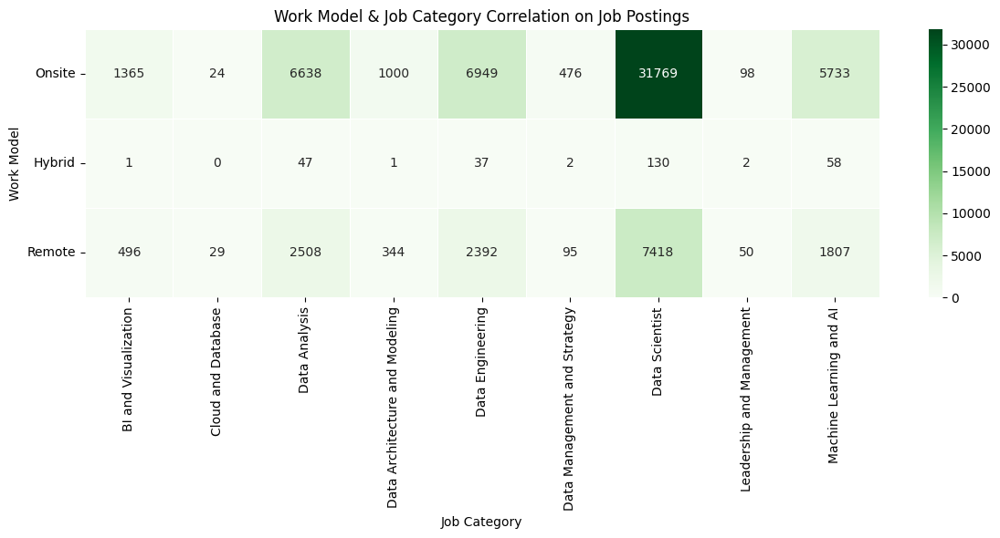

In [76]:
#   

job_postings_by_work_model = pd.crosstab(data_df['work_model'], data_df['job_category'])
plt.figure(figsize=(12,6))
sns.heatmap(job_postings_by_work_model, annot=True, fmt='d', cmap='Greens', linewidths=0.5)
plt.title('Work Model & Job Category Correlation on Job Postings')
plt.xlabel('Job Category')
plt.ylabel('Work Model')

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

**Insights:**
* Data Scientists are prioritized for hiring, especially for onsite positions.
* There are a significant number of remote positions for Data Scientists, Data Analysts, and Data Engineers, demonstrating that remote work remains a popular trend.
* The hybrid work model appears to be utilized less by companies than the main three.
* There is a balance between the number of Data Analyst, Data Engineer, and Data Scientist positions being hired for both onsite and remote work.

#### **Employment Type** and **Job Category** Correlation on by Job Postings


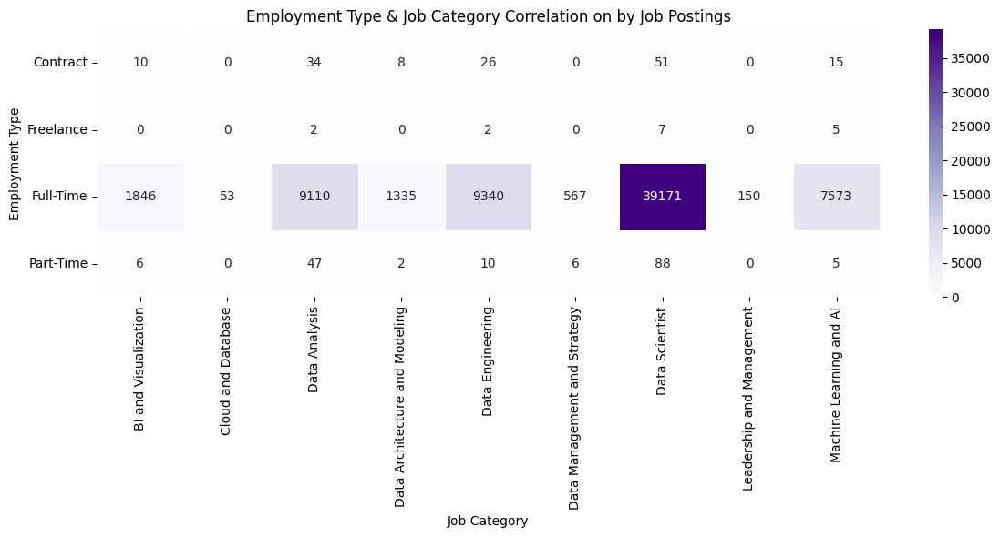

In [77]:
# Employment Type & Job Category Correlation on by Job Postings

job_category_by_employment_type = pd.crosstab(data_df['employment_type'], data_df['job_category'])
plt.figure(figsize=(12,6))
sns.heatmap(job_category_by_employment_type, annot=True, fmt='d', cmap='Purples', linewidths=0.5)
plt.title('Employment Type & Job Category Correlation on by Job Postings')
plt.xlabel('Job Category')
plt.ylabel('Employment Type')

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

**Insights:**
* Full-time hiring is overwhelmingly dominant compared to other employment types.
* The Data Scientist position is the most hired role, especially in full-time positions.
* Freelancer and part-time roles are not common in this field.
* Some contract positions still exist, indicating a demand for short-term projects.

#### **Average Salary (USD)** by **Experience Level** and **Job Category**

In [78]:
# Filtering the DataFrame for 'Full-time' employment type
data_full_time = data_df[data_df['employment_type'] == 'Full-Time']

In [79]:
# Create a DataFrame with the average salary grouped by 'job_category' and 'experience_level'
summary_table = data_full_time.groupby(['job_category', 'experience_level']).agg(average_salary=('salary_in_usd', 'mean')).reset_index()
# Convert the 'average_salary' to thousands (k) in the summary table
summary_table['average_salary'] = (summary_table['average_salary'] / 1000).round(1)
# print(summary_table)

# Salary_Experience_Level_Job_Category_Analysis
# Sort the DataFrame by 'experience_level'
data_full_time = data_full_time.sort_values(by='experience_level', ascending=True)

fig = px.bar(
    summary_table,
    x='job_category',
    y='average_salary',
    color='experience_level',
    barmode='group',
    title='Average Salary (USD) by Experience Level and Job Category',
    labels={'salary_in_usd': 'Average Salary (USD)', 'job_category': 'Job Category'},
    width=1000, height=600
    
)

fig.update_layout(
    xaxis_title='Job Category',
    yaxis_title='Average Salary (USD)',
    legend_title='Experience Level',
    xaxis_tickangle=-90
)

# Show the plot
fig.show()

**Insights:**
* Salaries generally increase with experience and vary significantly across job categories, with directors typically earning the highest.
* Fields like AI and Machine Learning command the highest salaries, while Data Management tends to have lower salaries.
* Market demand, experience skills, along with location and company size all influence salary levels, and salary hierarchies are usually consistent with experience.   
* The current job market highly values technology-related roles, especially those in AI. 

#### **Average Salary (USD)** by **Company Size** and **Job Category**

In [80]:
# Create a DataFrame with the average salary grouped by 'job_category' and 'company_size'
summary_table_1 = data_full_time.groupby(['job_category', 'company_size']).agg(average_salary=('salary_in_usd', 'mean')).reset_index()
# Convert the 'average_salary' to thousands (k) in the summary table
summary_table_1['average_salary'] = (summary_table_1['average_salary'] / 1000).round(1)
# print(summary_table_1)

# Bar Chart: Average Salary Comparison by Company Size and Job Category
# Sort the DataFrame by 'company_size'
data_full_time = data_full_time.sort_values(by='company_size', ascending=True)

fig = px.bar(
    summary_table_1,
    x='job_category',
    y='average_salary',
    color='company_size',
    barmode='group',
    title='Average Salary (USD) by Company Size and Job Category',
    labels={'salary_in_usd': 'Average Salary (USD)', 'job_category': 'Job Category'},
    width=1000, height=600
    
)

fig.update_layout(
    xaxis_title='Job Category',
    yaxis_title='Average Salary (USD)',
    legend_title='Company Size',
    xaxis_tickangle=-90
)

# Show the plot
fig.show()

####  **Average Salary (USD)** for **Senior Data Scientists** by **Company Location**


**Insights:**
* Large companies generally offer higher average salaries across most job categories, likely due to greater resources.
* Medium companies are the exception and often offer better pay for Data Analysis, and Leadership & Management roles.
* Small companies tend to provide the lowest average salaries compared to medium and large organizations.
* There is a significant variance in pay among different job categories.

In [81]:
# Filtering the DataFrame for "Data Scientist" category AND "Senior" experience level

data_scientist = data_full_time[data_full_time['job_category'] == 'Data Scientist']
data_scientist_senior = data_scientist[data_scientist['experience_level'] == 'Senior']

# # Grouping by 'company_location' and calculating the average salary
summary_table_2 = data_scientist_senior.groupby('company_location').agg(average_salary=('salary_in_usd', 'mean')).reset_index()
summary_table_2['average_salary'] = (summary_table_2['average_salary'] / 1000).round(1)
summary_table_2_sorted = summary_table_2.sort_values(by ='average_salary', ascending=False)

fig = px.bar(
    summary_table_2_sorted, 
    x='company_location', 
    y='average_salary',
    color='average_salary', 
    color_continuous_scale='Tealgrn', 
    text_auto=True, 
    title='Senior Data Scientist average salary by company location',
    labels={'company_location': 'Company Location', 'average_salary': 'Average Salary (USD)'},
    width=1400, height=700)

fig.update_layout(xaxis_tickangle=-90, showlegend=False)
fig.update_traces(texttemplate='%{y:.1f}K', textposition='outside', textfont=dict(size=10))
fig.show()

**Insights:**
* It’s clear that where you as a Senior Data Scientist really matter when it comes to your paycheck. Average salaries for this role vary greatly from one country to another. 
* Argentina, the United States, and Switzerland are where you’ll likely find the highest compensation for Senior Data Science positions, likely because of the strong demand and higher cost of living in those areas.
* On the flip side, countries like Thailand and Russia tend to have the lowest average salaries for Senior Data Scientists. This might be due to differences in how well-established the Data Science field is in those countries, and the lower cost of living there.
* The differences in salaries can be attributed to things like: how expensive it is to live there, how much demand there is for these types of jobs in that location, the general economic state if the country, and the currency rates between the local currency and the dollar. 

#### **Average Salary** and **Work Model** Comparison by Job Postings

In [82]:
# Density Heatmap: Average Salary & Work Model Comparison by Job Postings

fig = px.density_heatmap(data_df, 
                         x='work_model', 
                         y='salary_in_usd', 
                         title='Salary by Work Model (Colored by Job Postings)', 
                         labels={'salary_in_usd': 'Salary (USD)', 'work_model': 'Work Model'}, 
                         color_continuous_scale='Blues', 
                         height=600, width=800)

fig.show()

**Insights:**
* Onsite work remains the most common model, especially for jobs at mid-range and higher salary levels.
* The majority of job opportunities are concentrated within the 100k to 200k dollar salary range.
* Remote job posting are less numerous compared to onsite options, and they tend to cluster around the 100k to 175k dollar salary range.
* The hybrid work model is the least prevalent among the three, and it exhibits a narrower salary range.
* The overall salary level does not seem to be greatly influenced by the work model chosen.
* Hybrid models may be utilized by companies to retain talent that desires flexibility while being familiar with onsite work. 

#### **Data Scientist** career in the **United States**


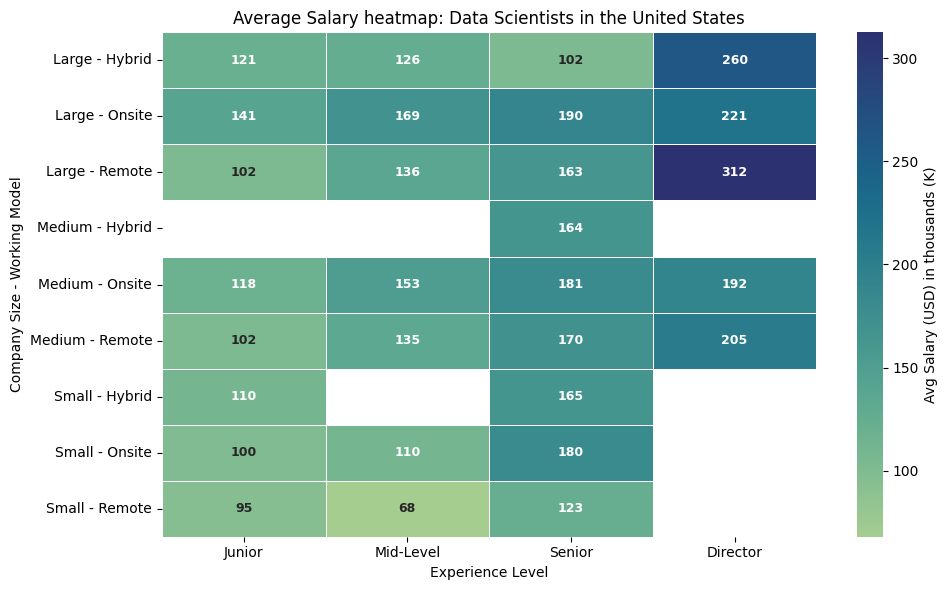

In [83]:
# Filtering the original data frame 'data_df' to select only United States and Data Scientist and Full-time
data_us = data_scientist[data_scientist['company_location'] == 'United States']

# Creating a summary table grouped by work model, company size, and experience level
summary_table_3 = data_us.groupby(['work_model','company_size','experience_level'])['salary_in_usd'].mean().round().reset_index(name='average_salary')
summary_table_3['average_salary'] = (summary_table_3['average_salary']/1000).round(1)

# Convert 'company_size' and 'work_model' to strings for concatenation
summary_table_3['company_size'] = summary_table_3['company_size'].astype(str)
summary_table_3['work_model'] = summary_table_3['work_model'].astype(str)

# Combining the columns 'company_size' and 'work_model' into a single column
summary_table_3['company_model'] = summary_table_3['company_size'] + ' - ' + summary_table_3['work_model']
summary_table_3 = summary_table_3[['company_model', 'experience_level', 'average_salary']]

# Create a heatmap using seaborn
plt.figure(figsize=(10,6))
heatmap_data = summary_table_3.pivot_table(index='company_model', columns='experience_level', values='average_salary')
sns.heatmap(data=heatmap_data, annot=True, fmt=".0f", linewidths=.5,  cmap="crest", cbar_kws={'label': 'Avg Salary (USD) in thousands (K)'},
            annot_kws={'size': 9, 'fontweight': 'bold'})

plt.title('Average Salary heatmap: Data Scientists in the United States')
plt.xlabel('Experience Level')
plt.ylabel('Company Size - Working Model')
plt.xticks(rotation=0, ha='center')
plt.tight_layout()
plt.show()

**Insights:**
* Director-level positions consistently have the highest average salaries, especially in large and remote companies.
* Large companies generally offer higher pay compared to medium and small companies, particularly for leadership roles.
* Salaries for Data Scientists increase as experience progresses from junior to mid-level and then to senior.
* Small companies typically provide lower average salaries compared to larger companies.
* Remote work models can lead to a pay increase at high-level positions, primarily in large organizations.
* Experience plays a vital role in determining the salary level of Data Scientists.

#### **Job title** Distribution by Job Postings

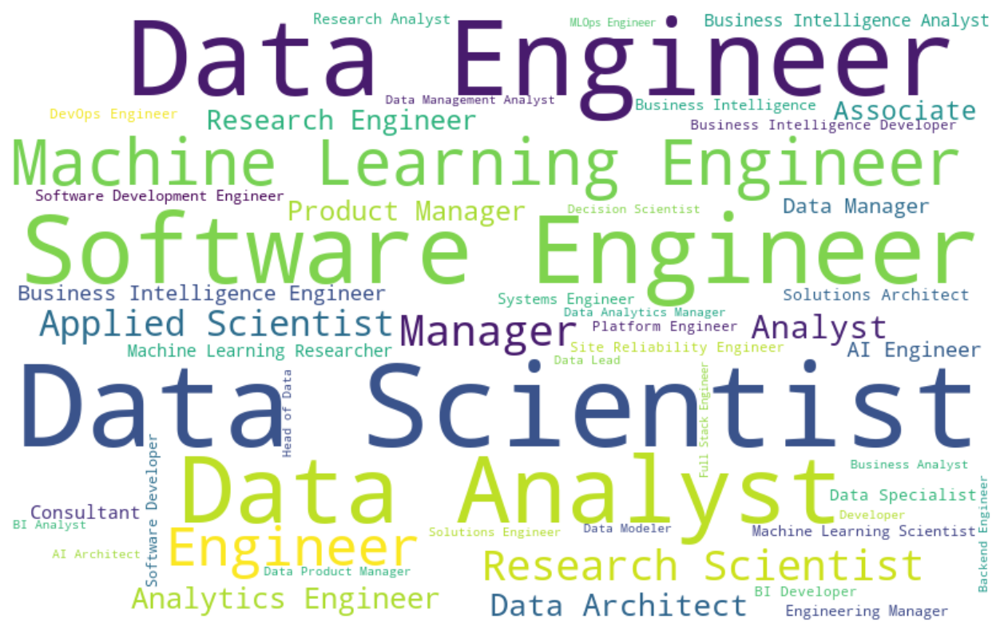

In [118]:
# WordCloud: Job title Distribution by Job Postings

def Freq_df(cleanwordlist):
    # Create frequency distribution from the cleaned word list
    Freq_dist_nltk = nltk.FreqDist(cleanwordlist)
    df_freq = pd.DataFrame.from_dict(Freq_dist_nltk, orient='index') # Convert to DataFrame
    df_freq.columns = ['Frequency'] # Set column name
    df_freq.index.name = 'Term' # Set index name
    df_freq = df_freq.sort_values(by=['Frequency'], ascending=False) 
    df_freq = df_freq.reset_index()
    return df_freq

def Word_Cloud(data, color_background, colormap, title):
    plt.figure(figsize=(20,10))
    wc = WordCloud(width=800, height=500, 
                   max_words=50, 
                   colormap='viridis', 
                   max_font_size=100,
                   random_state=45,
                   background_color = color_background).generate_from_frequencies(data) # Generate word cloud from frequency data
    plt.imshow(wc, interpolation='bilinear') # Display the word cloud with smooth interpolation
    plt.title(title, fontsize=15)
    plt.axis('off')
    plt.show()

# Create the frequency DataFrame from Job titles
freq_df = Freq_df(data_df['job_title'].values.tolist())
data = dict(zip(freq_df['Term'].tolist(), freq_df['Frequency'].tolist())) # Convert to dictionary
data = freq_df.set_index('Term').to_dict()['Frequency']  # Set index to 'Term' and convert to dictionary

# Generate the word cloud
Word_Cloud(data, 'white', 'viridis', '') # Black background, RdBu colormap, no title

**Insights:**

The current job market is dominated by tech and data roles. Positions related to data processing, analysis, and management are highly prevalent, highlighting the digitalization trend across various industries. To meet this demand, both technical skills in system building and analytical skills for decision-marking based on data are crucial, Additionally, the variety of specialized roles showcases increasing specialization in the tech market and the ever-growing importance of leadership in complex technology-based projects. 

## Summary

### Summary

The Data Science job market is experiencing strong growth, especially in 2024, with the highest demand focused on Data Scientist positions. The US is the main hub of this market, and medium-sized companies are the most active recruiters. While onsite work remains prevalent, remote work options also hold significant importance. Salaries tend to increase, particularly for experienced professionals, management roles, and those in AI/Machine Learning fields. Factors such as experience, position, company size, and location all have a significant impact on salary.

### Key Insights

* **High Demand for Data Scientists:** Data Scientist positions are the most in-demand, comprising over half of all job postings, indicating a strong market focus.
* **Strong Growth in the Data Science Market:** 2024 is seeing a surge in hiring demand in Data Science, especially for roles in Machine Learning, AI, and Data Engineering.
* **The US is the Main Hub:** The majority of job postings and employees in Data Science are located in the United States, making it the most important market.
* **Medium-sized Companies Dominate Hiring:** Medium-sized companies tend to hire more Data Science professionals compared to large or small companies.
* **Onsite Work Remains Prevalent:** Despite the growth of remote work, onsite work is still the most common model in Data Science.
* **Steady Salary Growth:** Salaries in Data Science tend to increase steadily, particularly in management, Data Science, and Data Engineering roles.
* **Experience and Position Greatly Influence Salary:** Salaries increase with experience and there is a significant difference between positions, with management positions typically having the highest salaries.
* **Salaries Vary by Country:** Salaries for Senior Data Scientists vary greatly between countries, reflecting differences in demand, cost of living, and other economic factors.
* **Roles of Technology and Analytics:** Positions related to technology and data analysis are dominating the job market, highlighting the importance of technical and analytical skills.
* **Variety in Work Models:** Although onsite work is still the most common, there is a significant number of remote positions, especially for Data Scientists, Data Analysts, and Data Engineers.  

### Recommendation

* **For Job Seekers**:  Focus on Data Scientist, Data Engineering, and Machine Learning/AI positions. Develop technical and data analysis skills. Consider opportunities in the US and at medium-sized companies. 
* **For Employers:** Prioritize finding and attracting experienced Data Scientist professionals. Offer competitive salaries and flexible work models to attract top talent. Consider expanding remote recruitment to access a wider pool of potential candidates.
* **For Those Seeking Career Advancement:** Invest in developing specialized skills, particularly in AI/Machine Learning. Consider transitioning into management positions for higher compensation.
